# Visualize Voices and Sounds

### source ~/venv38/bin/Activate
### jupyter lab

In [8]:
import numpy as np
try:
    import pyaudio
except:
    !pip3 install pyaudio
    import pyaudio
    
import matplotlib.pyplot
import matplotlib.pyplot as plt

try:
    import librosa, librosa.display
except:
    !pip3 install librosa
    import librosa, librosa.display

try:
    import wave
except:
    !pip3 install wave
    import wave
    
import IPython.display as ipd
import time, csv, os

In [9]:
sr = 20000  # sampling rate - high freq for audio
chunk_size = sr // 4  # how much data

In [10]:
p = pyaudio.PyAudio()
device_keep_list = []
print("----------------------record device list---------------------")
info = p.get_host_api_info_by_index(0)
numdevices = info.get('deviceCount')
for i in range(0, numdevices):
        if (p.get_device_info_by_host_api_device_index(0, i).get('maxInputChannels')) > 0:
            print("Input Device id ", i, " - ", p.get_device_info_by_host_api_device_index(0, i).get('name'))
            if (p.get_device_info_by_host_api_device_index(0, i).get('name')[0:7] == 'MacBook'):
                device_keep_list = np.append(device_keep_list,i)

print("-------------------------------------------------------------")


----------------------record device list---------------------
Input Device id  1  -  HD Pro Webcam C920
Input Device id  2  -  MacBook Pro Microphone
Input Device id  4  -  Microsoft Teams Audio
Input Device id  5  -  ZoomAudioDevice
-------------------------------------------------------------


In [11]:
# store data
def store_data(signal,stack):
    # sum will treat Boolean True as a 1, False as a 0
    n = sum(os.path.isfile("data/"+name) for name in os.listdir('data/'))
    file_name = "data/Store_%s" % n 
    print("\nStoring recorded data in",file_name)

    with open(file_name+"_signal.csv", "a+", newline='') as file:
        writer = csv.writer(file, delimiter=',')
        writer.writerow([signal[jj] for jj in range(len(signal))])
    # check 
    signal_read = []
    with open(file_name+"_signal.csv", 'r') as file:
        reader = csv.reader(file)   
        for row in reader:
            signal_read.append([float(row[ii]) for ii in range(len(row))])

    aa,bb = stack.shape
    for jj in range(aa):
        with open(file_name+"_stack.csv", "a+", newline='') as file:
            writer = csv.writer(file, delimiter=',')
            writer.writerow([stack[jj,ii] for ii in range(bb)])

    stack_read = []
    with open(file_name+"_stack.csv", 'r') as file:
        reader = csv.reader(file)   
        for row in reader:
            stack_read.append([float(row[ii]) for ii in range(len(row))])

    print(f"Signal reload errors of {np.max(np.abs(signal_read - signal)):.6e}")
    print(f"Stack reload errors of {np.max(np.abs(stack_read - stack)):.6e}\n")
    
    return file_name

## Collect Microphone data

In [5]:
stream = p.open(format=pyaudio.paFloat32,channels=1,rate=sr,input=True,input_device_index=2,frames_per_buffer=chunk_size)
alldata =[]
frames = []

do_melspec = librosa.feature.melspectrogram
pwr_to_db = librosa.core.power_to_db
tf = 10
start = time.time()
while (time.time() < start + tf):
    data = stream.read(chunk_size,exception_on_overflow = False)
    data = np.frombuffer(data, dtype=np.float32)
    alldata.append(data)
    melspec = do_melspec(y=data, sr=sr, n_mels=128, fmax=4096)
    norm_melspec = pwr_to_db(melspec, ref=np.max)
    frames.append(norm_melspec)
    print(f"{time.time() - start:.1f} ",  end = '')

signal = np.hstack(alldata)
stack = np.hstack(frames)

stored_file_names = store_data(signal,stack)

0.0 0.0 0.0 0.1 0.4 0.6 0.9 1.1 1.4 1.6 1.9 2.2 2.3 2.6 2.8 3.1 3.3 3.6 3.9 4.1 4.4 4.6 4.9 5.1 5.4 5.6 5.8 6.1 6.3 6.6 6.8 7.1 7.4 7.6 7.9 8.1 8.4 8.6 8.9 9.1 9.3 9.6 9.8 10.1 
Storing recorded data in data/Store_278
Signal reload errors of 7.415390e-09
Stack reload errors of 3.796387e-06



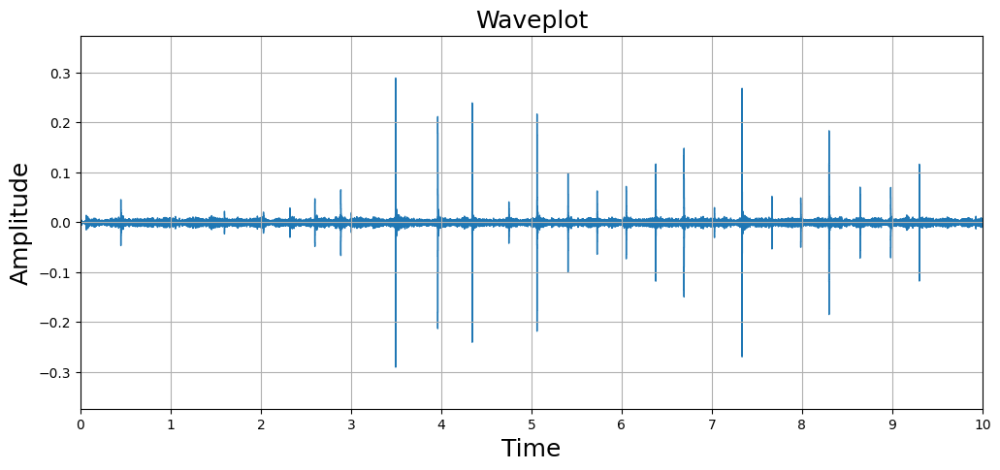

In [6]:
plt.figure(figsize=(12, 5))
librosa.display.waveshow(signal, sr=sr)
plt.title('Waveplot', fontdict=dict(size=18))
plt.xlabel('Time', fontdict=dict(size=18))
plt.ylabel('Amplitude', fontdict=dict(size=18))
plt.xlim(0,tf)
plt.savefig('./figs/mic_0.png', bbox_inches='tight', dpi=300)
plt.show()

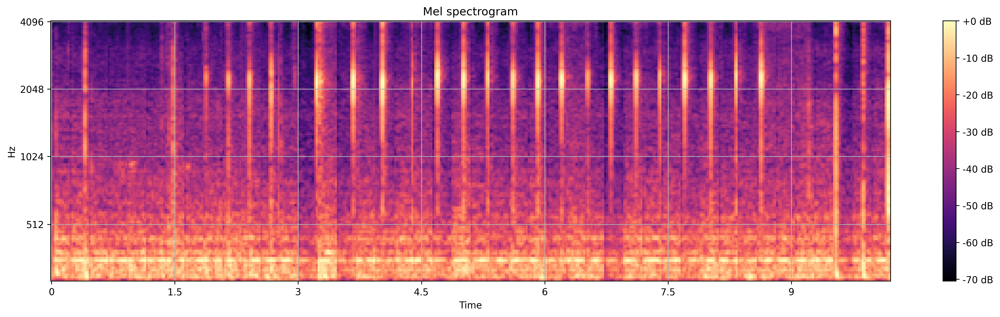

In [7]:
plt.figure(1,figsize=(20, 5),dpi=300)
librosa.display.specshow(stack, y_axis='mel', fmin = 100, fmax = 4096, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel spectrogram')
plt.savefig('./figs/mic_1.png', bbox_inches='tight', dpi=300)
plt.show()

## Try some sample cases

In [8]:
def plotdata(titledata):
    plt.figure(figsize=(12, 5),dpi=300)
    librosa.display.waveshow(signal, sr=sr)
    plt.title(titledata, fontdict=dict(size=18))
    plt.xlabel('Time', fontdict=dict(size=15))
    plt.ylabel('Amplitude', fontdict=dict(size=15))
    fname = ['./figs/'+titledata+'_0.png'] 
    plt.savefig(str(fname[0]), bbox_inches='tight', dpi=300)
    plt.show()

    mel_signal = librosa.feature.melspectrogram(y=signal, sr=sr, hop_length=hop_length, n_fft=n_fft)
    power_to_db = librosa.power_to_db(np.abs(mel_signal), ref=np.max)

    plt.figure(figsize=(20, 5),dpi=300)
    librosa.display.specshow(power_to_db, sr=sr, x_axis='time', y_axis='mel', cmap='magma', hop_length=hop_length)
    plt.colorbar(label='dB')
    plt.title('Mel-Spectrogram (dB)', fontdict=dict(size=18))
    plt.xlabel('Time', fontdict=dict(size=18))
    plt.ylabel('Frequency', fontdict=dict(size=18))
    fname = ['./data/'+titledata+'_1.png'] 
    plt.savefig(str(fname[0]), bbox_inches='tight', dpi=300)
    plt.show()

In [9]:
# Parameters for the algorithms
n_fft = 2048      # this is the number of samples in a window per fft
hop_length = 512  # The amount of samples we are shifting after each fft

In [10]:
signal, sr = librosa.load(librosa.util.example('trumpet'))
ipd.Audio(signal, rate=sr)

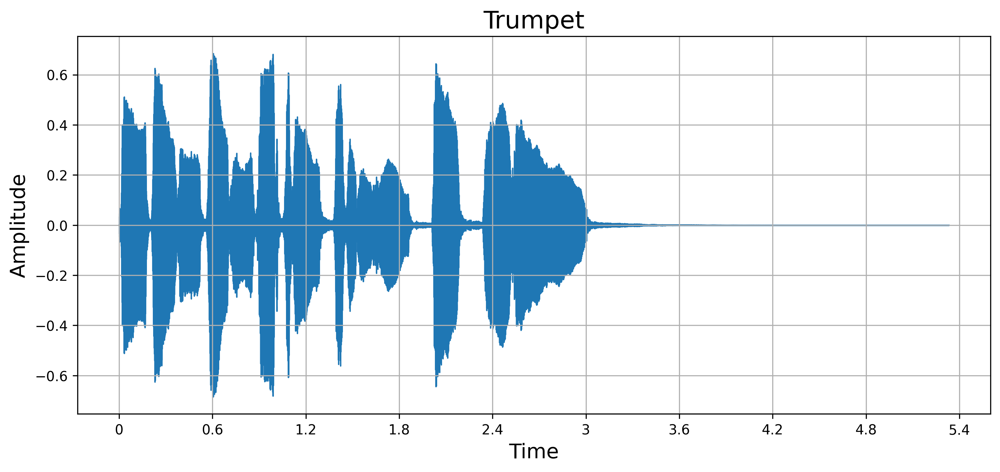

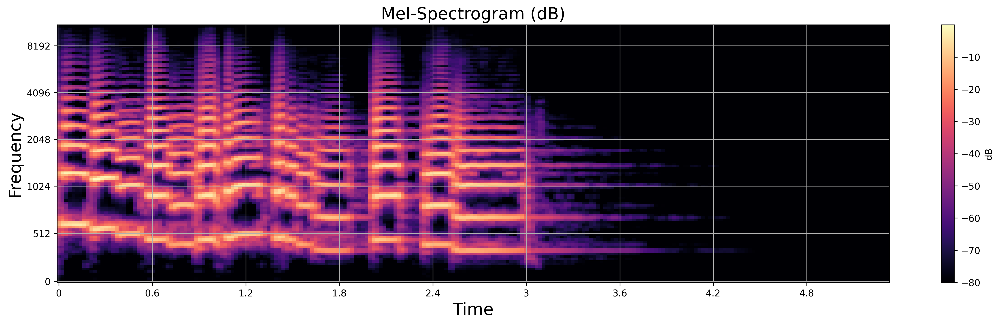

In [11]:
plotdata('Trumpet')

In [12]:
signal, sr = librosa.load(librosa.util.example('pistachio'))
ipd.Audio(signal, rate=sr)

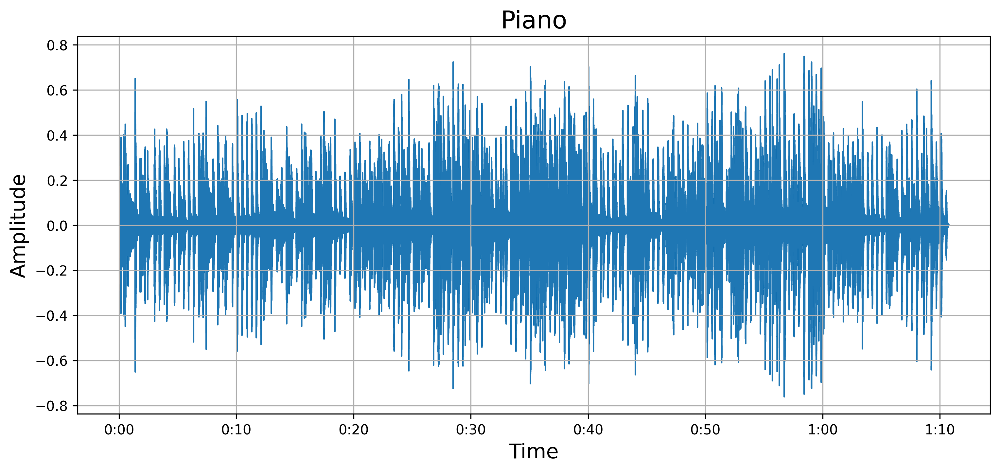

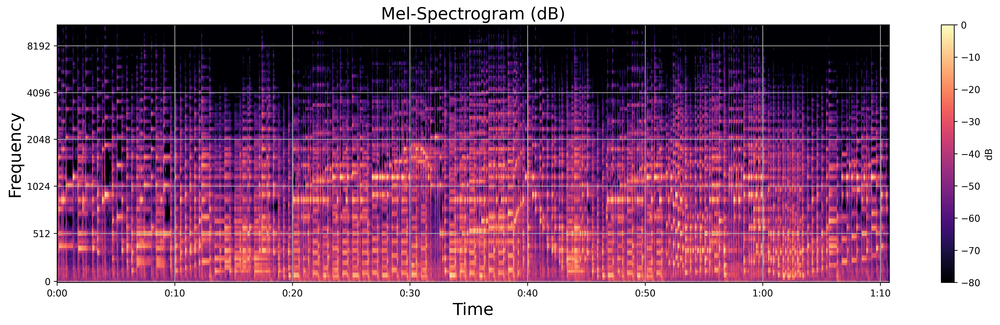

In [13]:
plotdata('Piano')

In [14]:
signal, sr = librosa.load(librosa.util.example('humpback'))
ipd.Audio(signal, rate=sr)

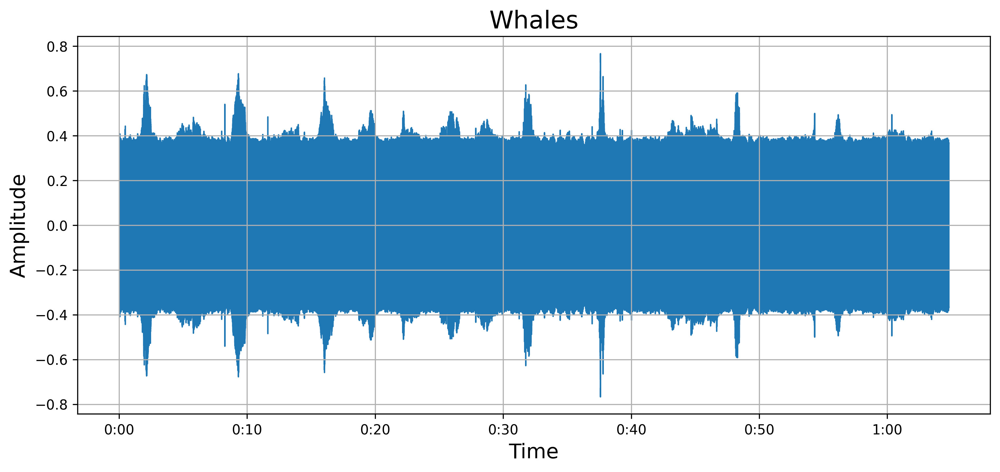

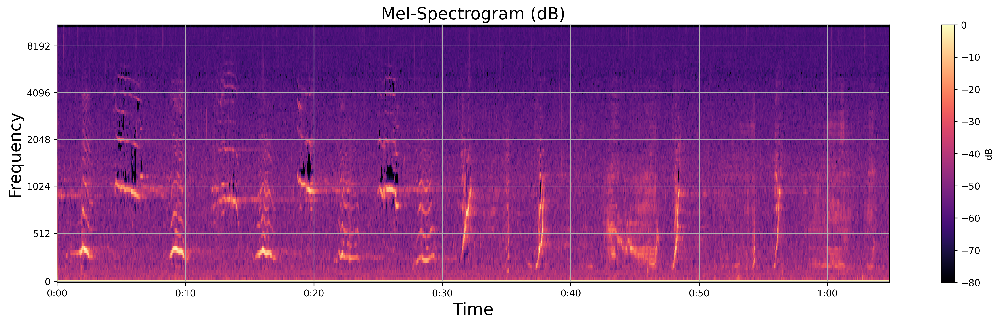

In [15]:
plotdata('Whales')